### check annotations

In [ ]:
import zipfile

with zipfile.ZipFile('images.zip',"r") as zip_ref:
  zip_ref.extractall()

(1251, 2048, 3)


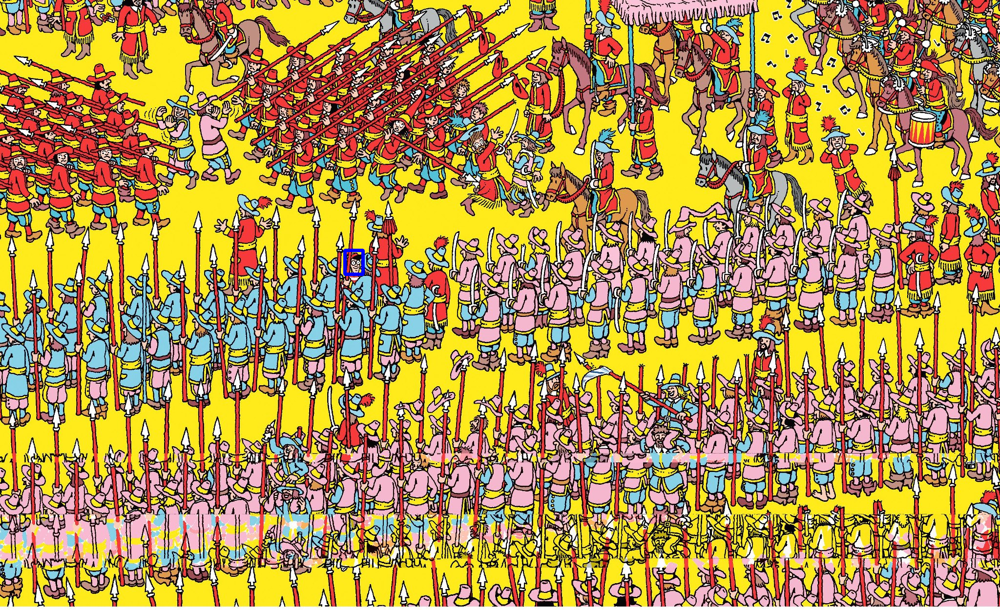

In [ ]:
from IPython.display import display
from PIL import Image, ImageDraw
import cv2 as cv
import numpy as np


# rotation (3), resize smaller larger (11,16), flip horizontal, face thin fat (1,2,5,12), face whiter

# only 36 images instead of 49
# 8,10,36 has multiple waldos so can't use this function directly below
from google.colab.patches import cv2_imshow
image = '1.jpg'
orig_image = cv2.imread('/'.join(['images',image]))
print(orig_image.shape)

import pandas as pd

annotations=pd.read_csv('annotations.csv')
row=annotations[annotations['filename']==image]

img1 = cv2.rectangle(orig_image, (row['xmin'], row['ymin']), 
                      (row['xmax'], row['ymax']), (255,0,0),5)

cv2_imshow(img1)

### Putting it all together

### 1. create tf records - import create_trecords.py, images.zip,eval_images.zip,annotations.csv,orig_model.zip and unzip

In [ ]:
%tensorflow_version 1.15.4
import os
print(os.listdir())

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.15.4`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.
['.config', 'new.config', 'annotations.csv', 'object_detection', 'eval_images.zip', 'images', 'new_checkpoint', '.ipynb_checkpoints', 'create_tfrecords.py', 'orig_model', 'models', 'labels.txt', 'eval_images', 'sample_data']


In [ ]:
import zipfile
for f in os.listdir():
  if 'zip' in f:
    with zipfile.ZipFile(f,"r") as zip_ref:
      zip_ref.extractall()

In [8]:
# download the faster rcnn inception model
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2017_11_08.tar.gz
!tar -xzvf faster_rcnn_inception_v2_coco_2017_11_08.tar.gz 
!mv faster_rcnn_inception_v2_coco_2017_11_08 orig_model
!rm faster_rcnn_inception_v2_coco_2017_11_08.tar.gz

--2021-06-05 18:47:16--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2017_11_08.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.126.128, 2607:f8b0:4001:c34::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.126.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149108974 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2017_11_08.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.20M   294MB/s    in 0.5s    

2021-06-05 18:47:17 (294 MB/s) - ‘faster_rcnn_inception_v2_coco_2017_11_08.tar.gz’ saved [149108974/149108974]

faster_rcnn_inception_v2_coco_2017_11_08/
faster_rcnn_inception_v2_coco_2017_11_08/model.ckpt.index
faster_rcnn_inception_v2_coco_2017_11_08/model.ckpt.meta
faster_rcnn_inception_v2_coco_2017_11_08/pipeline.config
faster_rcnn_inception_v2_coco_2017_11_08/frozen_inference_graph.pb
faster_rcnn_inception_v2_coco_2017_11_08/mode

In [ ]:
# make new checkpoint directory
!mkdir new_checkpoint
# move new labels and config into new trained model folder
!mv labels.txt orig_model/labels.txt
!mv new.config orig_model/new.config

### 2. clone object detection api

In [ ]:
# clone the object detection api 
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 57779, done.
remote: Counting objects: 100% (201/201), done.
remote: Compressing objects: 100% (185/185), done.
remote: Total 57779 (delta 89), reused 119 (delta 15), pack-reused 57578
Receiving objects: 100% (57779/57779), 572.94 MiB | 38.82 MiB/s, done.
Resolving deltas: 100% (40014/40014), done.


In [ ]:
%cd models/research
# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf1/setup.py .
!python -m pip install .
# return back to content directory
%cd ../..

# object detection library can now be imported from anyfile

/content/models/research
Processing /content/models/research
     |████████████████████████████████| 358kB 28.4MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1652189 sha256=4efe8729bc956e2ff504511004435acb2d1bd4d7d9caba92e272aebcc2c53a39
  Stored in directory: /tmp/pip-ephem-wheel-cache-j897cxol/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection
/content


### 3.Create Waldo specific tfrecord files

In [ ]:
# modify create_pet_tf_record to use annotations.csv and images folder
# https://github.com/tadejmagajna/HereIsWally/blob/master/object_detection/create_pet_tf_record.py

import pandas as pd

annotations = pd.read_csv('annotations.csv')
annotations

,filename,width,height,class,xmin,ymin,xmax,ymax
0,1.jpg,2048,1251,waldo,706,513,743,562
1,10.jpg,1600,980,waldo,715,157,733,181
2,11.jpg,2828,1828,waldo,460,1530,482,1557
3,12.jpg,1276,1754,waldo,846,517,878,563
4,13.jpg,1280,864,waldo,932,274,942,288
5,14.jpg,1700,2340,waldo,197,1878,237,1919
6,15.jpg,1600,1006,waldo,297,428,311,445
7,17.jpg,1599,1230,waldo,751,250,772,281
8,18.jpg,1590,981,waldo,1259,75,1290,111
9,19.jpg,1280,864,waldo,338,623,351,640


In [ ]:
# run create_tfrecords.py with arguments for annotations_path and images_directory
!python create_tfrecords.py --annotations_path=annotations.csv --images_directory=images

training - ['36.jpg', '23.jpg', '24.jpg', '35.jpg', '33.jpg', '36.jpg', '13.jpg', '4.jpg', '18.jpg', '12.jpg', '15.jpg', '26.jpg', '30.jpg', '10.jpg', '9.jpg', '5.jpg', '36.jpg', '7.jpg', '19.jpg', '8.jpg', '29.jpg', '25.jpg', '1.jpg', '28.jpg', '36.jpg', '14.jpg', '3.jpg', '31.jpg', '10.jpg', '36.jpg'],
 test - ['11.jpg', '17.jpg', '2.jpg', '6.jpg', '8.jpg', '16.jpg', '20.jpg', '21.jpg', '22.jpg', '27.jpg', '32.jpg', '34.jpg', '36.jpg']


### 4. retrain faster rcnn model on waldo images

In [ ]:
# train until loss is below 0.01
!python models/research/object_detection/legacy/train.py --logtostderr --pipeline_config_path=orig_model/new.config --train_dir=new_checkpoint

# !python models/research/object_detection/legacy/train.py --logtostderr --pipeline_config_path=new_checkpoint/pipeline.config --train_dir=new_checkpoint

Streaming output truncated to the last 5000 lines.
INFO:tensorflow:global step 43402: loss = 0.0767 (0.441 sec/step)
I0604 12:17:29.989008 140039662819200 learning.py:512] global step 43402: loss = 0.0767 (0.441 sec/step)
INFO:tensorflow:global step 43403: loss = 0.0057 (0.167 sec/step)
I0604 12:17:30.157819 140039662819200 learning.py:512] global step 43403: loss = 0.0057 (0.167 sec/step)
INFO:tensorflow:global step 43404: loss = 0.0143 (0.401 sec/step)
I0604 12:17:30.561026 140039662819200 learning.py:512] global step 43404: loss = 0.0143 (0.401 sec/step)
INFO:tensorflow:global step 43405: loss = 0.0248 (0.342 sec/step)
I0604 12:17:30.906422 140039662819200 learning.py:512] global step 43405: loss = 0.0248 (0.342 sec/step)
INFO:tensorflow:global step 43406: loss = 0.0121 (0.190 sec/step)
I0604 12:17:31.098602 140039662819200 learning.py:512] global step 43406: loss = 0.0121 (0.190 sec/step)
INFO:tensorflow:global step 43407: loss = 0.0393 (0.338 sec/step)
I0604 12:17:31.438123 140039

### 5.Export inference graph and zip up new_checkpoint folder

In [ ]:
# export the graph to use in inferencing
!python models/research/object_detection/export_inference_graph.py --input_type image_tensor --pipeline_config_path new_checkpoint/pipeline.config --trained_checkpoint_prefix "new_checkpoint/model.ckpt-44938" --output_directory new_checkpoint

Instructions for updating:
Please use `layer.__call__` method instead.
W0604 12:39:50.311600 140484357478272 deprecation.py:323] From /usr/local/lib/python3.7/dist-packages/tf_slim/layers/layers.py:2802: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:Scale of 0 disables regularizer.
I0604 12:39:51.541038 140484357478272 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
I0604 12:39:51.670517 140484357478272 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0604 12:39:51.670975 140484357478272 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0604 12:39:51.728533 140484357478272 deprecati

In [ ]:
import shutil
shutil.make_archive("new_checkpoint", 'zip', "new_checkpoint")

'/content/new_checkpoint.zip'

### 6.Inferencing


In [ ]:
# find_wally.py
from matplotlib import pyplot as plt
import numpy as np
import sys
import tensorflow as tf
import matplotlib
from PIL import Image
import matplotlib.patches as patches
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

280 180
Wally found


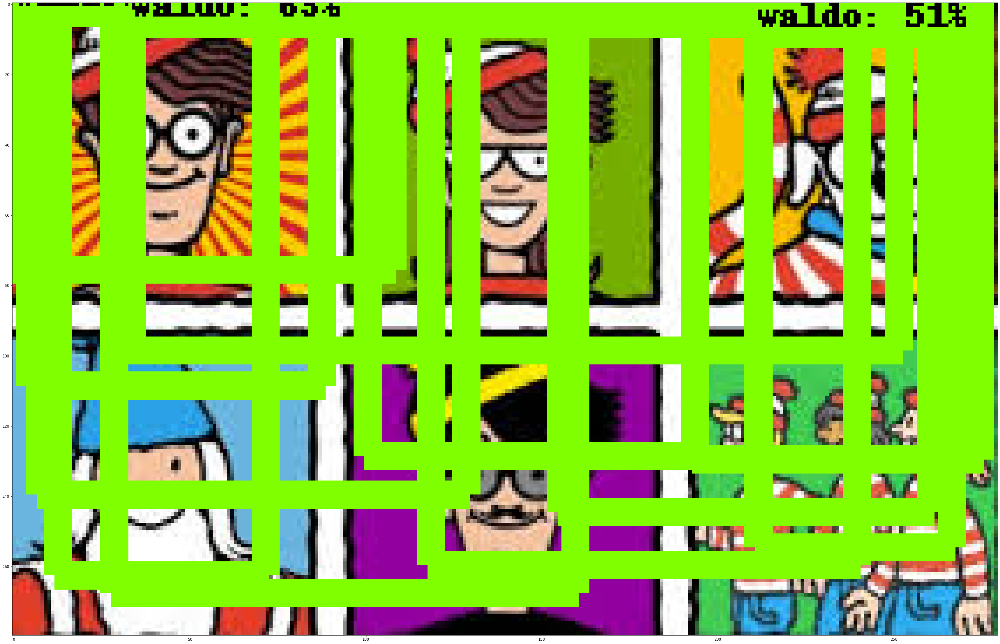

In [ ]:
# with tensorflow boxes
model_path = './new_checkpoint/frozen_inference_graph.pb'
image_path='./eval_images/10.jpg'

detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(model_path, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  # original size
  print(im_width,im_height)
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

label_map = label_map_util.load_labelmap('./orig_model/labels.txt')
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=1, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    image_np = load_image_into_numpy_array(Image.open(image_path))
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    scores = detection_graph.get_tensor_by_name('detection_scores:0')
    classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    # Actual detection.
    (boxes, scores, classes, num_detections) = sess.run(
        [boxes, scores, classes, num_detections],
        feed_dict={image_tensor: np.expand_dims(image_np, axis=0)})

    if scores[0][0] < 0.5:
        sys.exit('Wally not found :(')

    print('Wally found')
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        np.squeeze(boxes),
        np.squeeze(classes).astype(np.int32),
        np.squeeze(scores),
        category_index,
        use_normalized_coordinates=True, # allows boxes to conform to plot figure
        line_thickness=8)
    # control size of figure
    plt.figure(figsize=(48, 32))
    plt.imshow(image_np)
    plt.show()

In [ ]:
# look at dimensions of boxes, scores, and classes
print(image_np.shape)
print(boxes.shape)
print(scores.shape) # scores[0][0] has highest probability
print(classes.shape)
print(scores[0][0])
print(scores[0][1]) # since prob <0.5, doesn't show
# seems to only return top 300 boxes in decreasing probability

(1346, 2048, 3)
(1, 300, 4)
(1, 300)
(1, 300)
0.97947514
0.003375916


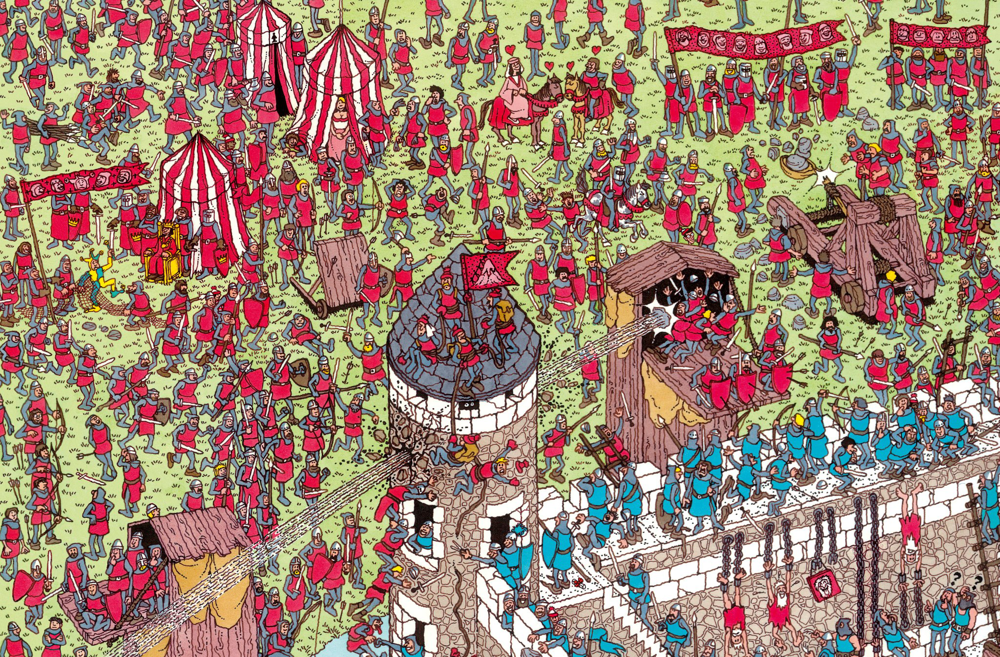

[0.34399748 0.6785909  0.37185872 0.6940496 ]
1346 2048
(1389, 463, 1421, 500)
(32, 37)


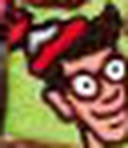

In [ ]:
# show image 
from IPython.display import display
from PIL import Image
orig_image = Image.open('./eval_images/1.jpg')
display(orig_image)
norm_box=boxes[0][0]
print(norm_box) # normalized coordinate of found image 99% as indicated by scores[0][0]
im_width,im_height=image_np.shape[0],image_np.shape[1]
print(im_width,im_height)
# tensorflow (upper,left,lower,right) -> PIL (left, upper, right, lower)
box = (int(norm_box[1]*im_height),int(norm_box[0]*im_width),int(norm_box[3]*im_height),int(norm_box[2]*im_width))
print(box)
cropped_image = orig_image.crop(box)
print(cropped_image.size)
# resize while keeping aspect ratio
cropped_image=cropped_image.resize((cropped_image.size[0]*4, cropped_image.size[1]*4), Image.ANTIALIAS)
display(cropped_image)
